# Action Recognition

#### Your objective is to construct action recognition models on a subset of the UCF101 dataset. The [UCF101 dataset](https://www.crcv.ucf.edu/data/UCF101.php) consists of a total of 13,320 videos spanning diverse human action categories. However, for the final project, our focus narrows down to a subset of the dataset, comprising 2,355 training videos and 969 test videos distributed among 30 action categories. You will have to build one binary classifier and one multi-class classifier.

## **1. Binary Classifier for JugglingBalls [[6 points]](https://)**
#### Build a classifier for the class *JugglingBalls*. Your goal is to train a model to classify JugglingBalls videos as *positive* and the remaining videos as *negative*. You are free to choose any machine learning models from the class.
#### **1-1. Hyper-parameter Search [[3 points]](https://).** Show your hyperparameter search process using cross-validation. Present at least for one hyper-parameter with 10 different possible values.
#### **1-2. Model Training and Testing [[3 points]](https://).** Then, train your model with the best combination of the hyper parameters and run the model on the test set, and submit the results to the Kaggle competition. To get full marks, your model should outperform the baseline model, which is provided in Kaggle. You **must** show your test performance score computed by Kaggle in this report.   


## **2. Multi-Class Classifier [[12 points]](https://)**
#### Build a multi-class classifier for all 30 action classes. Your goal is to train a model to classify videos into corresponding categories. You are free to choose any machine learning models from the class.
#### **2-1. Hyper-parameter Search [[4 points]](https://).** Demonstrate your hyperparameter search process using cross-validation. Provide details for at least one hyperparameter with 10 different possible values.
#### **2-2. Model Training and Testing [[4 points]](https://).** Following the hyperparameter search, train your model with the best combination of hyperparameters. Run the model on the test set and submit the results to the Kaggle competition. To get full marks, your model should outperform the baseline model, which is provided in Kaggle. You **must** show your test performance score computed by Kaggle in this report.   
#### **2-3. Model Analysis [[4 points]](https://).** Conduct a thorough analysis of your model, including:
#### **2-3-1. Confusion Matrix:** Split the training set into train/validation sets, and retrain your model using the best hyperparameter combination. Present the confusion matrix on the validation set.
#### **2-3-2. Example Examination:** Examine one validation sample where your model fails to classify into the correct category. Display the true label, top-5 predicted labels, and display the video you examined. You can use the provided function `video_to_gif()` to convert .avi files to .gif. Refer to the example below.



---

## **A. Data Download**
#### For your convenience, we have provided codes to download the dataset, which includes videos, true labels, and features.

#### **A-1. Download Features and Labels.**
#### Run the following code to download the features and the true labels of the videos. We extracted features from the [InceptionV3 model](https://arxiv.org/abs/1512.00567) that has been pre-trained on the [ImageNet-1k dataset](http://image-net.org/).
#### Frames are extracted from each video, and the pre-trained was used to obtain a 2048-D feature vector for every frame. We store the feature vectors for the first 20 frames. For example, you will find an array of shape (2355, 20, 2048) for `train_feature`, where the array contains features for 2,355 videos. Each video is represented by 20 frames, and each frame is encoded by a 2048-dimensional feature vector.
#### As each video is represented by a 20x2048 array, you may need to encode them into an N-dimensional vector. One approach is to  use only the feature vector for the first frame of each video.

In [1]:
import numpy as np
!pip install gdown

In [2]:
!gdown --id 1gO6BYxkNnnR7j_Iro4exIkpya91xVXhl # train feature
!gdown --id 1zcW5v-Jdv0BWeCpu6yMY9vZbSy7Va6j5 # train label
!gdown --id 1XY4wjqNwaZC8dFJNvtaXAA8oM9k7VBHm # test feature

with open('train_feature.npy', 'rb') as f:
  train_feature = np.load(f)
with open('train_label.npy', 'rb') as f:
  train_label = np.load(f)
with open('test_feature.npy', 'rb') as f:
  test_feature = np.load(f)

In [3]:
print('Shape of train_feature: {0}'.format(train_feature.shape))
print('Shape of train_label: {0}'.format(len(train_label)))
print('Shape of test_feature: {0}'.format(test_feature.shape))

Shape of train_feature: (2355, 20, 2048)
Shape of train_label: 2355
Shape of test_feature: (969, 20, 2048)


#### The labels of the videos are represented as strings. Since models cannot process strings, it is necessary to convert these labels into integers. We use the following `label_list` to map the class labels to integers. This same `label_list` can be used to interpret the model's predictions.

In [4]:
label_list = ['ApplyLipstick', 'BalanceBeam', 'BlowingCandles', 'BodyWeightSquats',
                    'BreastStroke', 'CleanAndJerk', 'CuttingInKitchen', 'Fencing',
                    'FieldHockeyPenalty', 'HandstandWalking', 'HighJump', 'JugglingBalls',
                    'JumpingJack', 'MoppingFloor', 'ParallelBars', 'PizzaTossing',
                    'PlayingPiano', 'PlayingTabla', 'PlayingViolin', 'PullUps',
                    'PushUps', 'Rafting', 'RopeClimbing', 'Skijet',
                    'SkyDiving', 'StillRings', 'SumoWrestling', 'TaiChi',
                    'UnevenBars', 'VolleyballSpiking']

#### **A-2. Download Videos.**
#### Run the following code to download the videos and the true label names of the videos. In `ucf101_subset_train.tar.gz`, you will find `train.csv` and the folder `./train/`.

In [5]:
!gdown --id 1BC0KaP5OUrCAb10kaekN3iXrcfDQ_GU-
!tar xf "ucf101_subset_train.tar.gz"

In [6]:
import pandas as pd
train_df = pd.read_csv("train.csv")
print(train_df)

                           video_name                tag
0         v_ApplyLipstick_g08_c01.avi      ApplyLipstick
1         v_ApplyLipstick_g08_c02.avi      ApplyLipstick
2         v_ApplyLipstick_g08_c03.avi      ApplyLipstick
3         v_ApplyLipstick_g08_c04.avi      ApplyLipstick
4         v_ApplyLipstick_g09_c01.avi      ApplyLipstick
...                               ...                ...
2350  v_VolleyballSpiking_g24_c04.avi  VolleyballSpiking
2351  v_VolleyballSpiking_g25_c01.avi  VolleyballSpiking
2352  v_VolleyballSpiking_g25_c02.avi  VolleyballSpiking
2353  v_VolleyballSpiking_g25_c03.avi  VolleyballSpiking
2354  v_VolleyballSpiking_g25_c04.avi  VolleyballSpiking

[2355 rows x 2 columns]


#### **A-3. Displaying Videos in Notebook.**
#### Below shows how to display a .avi file in this notebook.

In [7]:
from moviepy.editor import VideoFileClip

In [8]:
def video_to_gif(video_filename):
  videoClip = VideoFileClip(video_filename)
  gif_filename = '{0}.gif'.format(video_filename.split('/')[1])
  videoClip.write_gif(gif_filename)
  return gif_filename

BreastStroke
train/v_BreastStroke_g22_c03.avi
MoviePy - Building file v_BreastStroke_g22_c03.avi.gif with imageio.


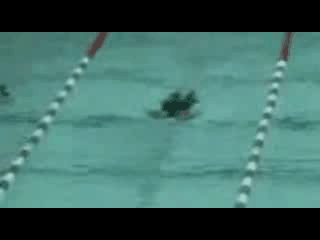

In [9]:
from IPython.display import Image
sample_filename = '/'.join(['train', train_df.loc[376, 'video_name']])
print(train_df.loc[376, 'tag'])
print(sample_filename)
gif_filename = video_to_gif(sample_filename) # convert an .avi file into a .gif file.
Image(open(gif_filename,'rb').read()) # display the gif file.

In [93]:
# Split the data into training and validation sets
from sklearn.model_selection import train_test_split
train_feature_flat = train_feature.reshape(len(train_feature), -1)
test_feature_flat = test_feature.reshape(len(test_feature), -1)
X_train, X_val, y_train, y_val = train_test_split(train_feature_flat, train_label, test_size=0.2)

# print("Shape of X_train:", X_train.shape)
# print("Shape of X_val:", X_val.shape)
# print("Shape of y_train:", y_train.shape)
# print("Shape of y_val:", y_val.shape)

In [94]:
# Convert string labels to integers
label_dict = {label: idx for idx, label in enumerate(label_list)}

# BINARY CLASSIFIER

In [95]:
# Convert y_train and y_val to bit arrays
train_label_int = np.array([1 if label == label_dict['JugglingBalls'] else 0 for label in y_train]).ravel()
val_label_int = np.array([1 if label == label_dict['JugglingBalls'] else 0 for label in y_val]).ravel()

# print("Shape of train_label_int:", train_label_int.shape)
# print("Shape of val_label_int:", val_label_int.shape)

In [16]:
import numpy as np
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import GridSearchCV

## CROSS VALIDATION
tested thresholds_percentile with 10 possible values.

In [91]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('svm', SVC())
])

# Define the parameter grid to search
param_grid = {
    'svm__C': [0.001, 0.01, 0.1, 1],
    'svm__kernel': ['linear', 'rbf'],
    'svm__gamma': ['scale', 'auto']
}

# Perform Grid Search with 5-fold cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, train_label_int)

# Get the best parameters and the best SVM model
best_params = grid_search.best_params_
best_svm_model = grid_search.best_estimator_

# Evaluate the best model on the validation set
y_pred = best_svm_model.predict(X_val)
f1_val = f1_score(val_label_int, y_pred)

print(f"Best Hyperparameters: {best_params}")
print(f"Best SVM Model with PCA: {best_svm_model}")

# Evaluate the best model on the validation set
y_pred_prob_val = best_svm_model.decision_function(X_val)
min_decision_value = np.min(y_pred_prob_val)
max_decision_value = np.max(y_pred_prob_val)

# Search for the best threshold based on F1 score
thresholds_percentile = np.arange(0, 1, 0.1)
num_thresholds = len(thresholds_percentile)
best_threshold_p = None
best_threshold = None
best_f1_score = 0.0

for threshold_p in thresholds_percentile:
    threshold = min_decision_value + threshold_p * (max_decision_value - min_decision_value)
    y_pred_val = (y_pred_prob_val > threshold).astype(int)
    f1_val = f1_score(val_label_int, y_pred_val)

    if f1_val > best_f1_score:
        best_f1_score = f1_val
        best_threshold_p = threshold_p
        best_threshold = threshold

print(f"Best Threshold percentile: {best_threshold_p} (out of {num_thresholds} thresholds)")
print(f"Best Threshold: {best_threshold} (out of {num_thresholds} thresholds)")
print(f"Best F1 score on Validation Set: {best_f1_score}")

Best Hyperparameters: {'svm__C': 0.001, 'svm__gamma': 'scale', 'svm__kernel': 'linear'}
Best SVM Model with PCA: Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA()),
                ('svm', SVC(C=0.001, kernel='linear'))])
Best Threshold percentile: 0.6000000000000001 (out of 10 thresholds)
Best Threshold: -0.22926647782045517 (out of 10 thresholds)
Best F1 score on Validation Set: 0.9444444444444444


## TRAINING AND VALIDATING A MODEL

In [96]:
# Train an SVM classifier
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('svm', SVC(C=0.001, kernel='linear', decision_function_shape='ovo'))
])
pipeline.fit(X_train, train_label_int)

y_pred_prob = pipeline.decision_function(X_val)

threshold = -0.2
predictions_val = (y_pred_prob > threshold).astype(int)

# Calculate accuracy on the validation set
accuracy_val = accuracy_score(val_label_int, predictions_val)
print("Validation Accuracy:", accuracy_val)

# Calculate F1 score on the validation set
f1_val = f1_score(val_label_int, predictions_val)
print("Validation F1 Score:", f1_val)

Validation Accuracy: 0.9978768577494692
Validation F1 Score: 0.9565217391304348


## FINAL MODEL TRAINING AND PREDICTION

In [97]:
# Convert string labels to integers
train_label_int = np.array([1 if label == label_dict['JugglingBalls'] else 0 for label in train_label])

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('svm', SVC(kernel='linear', C = 0.001, decision_function_shape='ovo'))
])
pipeline.fit(train_feature_flat, train_label_int)

# Make predictions on the test set
y_pred_prob = pipeline.decision_function(test_feature_flat)
min_decision_value = np.min(y_pred_prob)
max_decision_value = np.max(y_pred_prob)

# print("Minimum Decision Value:", min_decision_value)
# print("Maximum Decision Value:", max_decision_value)

# Adjust the threshold
threshold = -0.2
y_pred_adjusted = (y_pred_prob > threshold).astype(int)

print("Adjusted Predictions:", y_pred_adjusted)

Adjusted Predictions: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 

In [ ]:
# IMPORTANT: use 'id' and 'predicted' as the column names
test_submission = pd.DataFrame({
    'id':list(range(len(y_pred_adjusted))),
    'predicted':list(y_pred_adjusted.astype('int32'))})
print(test_submission.shape)
test_submission.head()

(969, 2)


,id,predicted
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


In [ ]:
# submit the CSV file to the corresponding Kaggle competition.
test_submission.to_csv('SH2_0302.csv', index=False)

Kaggle result: f1 score = 0.82666

# MULTI-CLASS CLASSIFIER

## CROSS VALIDATION

tested pca__n_components with 10 possible values.

In [17]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA()),
    ('svm', SVC())
])

# Define the parameter grid to search
param_grid = {
    'pca__n_components': np.arange(0.5, 1.05, 0.05),
    'svm__kernel': ['linear'],
    'svm__max_iter': [100, 500]
}

# Perform Grid Search with 5-fold cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs = -1)
grid_search.fit(X_train, y_train.ravel())

# Get the best parameters and the best SVM model with PCA
best_params = grid_search.best_params_
best_svm_model = grid_search.best_estimator_

# Evaluate the best model on the validation set
y_pred = best_svm_model.predict(X_val)

accuracy_val = accuracy_score(y_val, y_pred)

print(f"Best Hyperparameters: {best_params}")
print(f"Best SVM Model with PCA: {best_svm_model}")
print("Accuracy:", accuracy_val)

/opt/homebrew/lib/python3.11/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).

Best Hyperparameters: {'pca__n_components': 0.8500000000000003, 'svm__kernel': 'linear', 'svm__max_iter': 100}
Best SVM Model with PCA: Pipeline(steps=[('scaler', StandardScaler()),
                ('pca', PCA(n_components=0.8500000000000003)),
                ('svm', SVC(kernel='linear', max_iter=100))])
Accuracy: 0.9511677282377919


## TRAINING AND VALIDATING A MODEL

In [50]:
# Train an SVM classifier
pipeline = Pipeline([
    ('pca', PCA(n_components=0.85)),
    ('svm', SVC(kernel='linear', max_iter=100))
])
pipeline.fit(X_train, y_train.ravel())

# Make predictions on the validation set
predictions_val = pipeline.predict(X_val)

# Calculate accuracy on the validation set
accuracy_val = accuracy_score(y_val, predictions_val)
print("Validation Accuracy:", accuracy_val)

Validation Accuracy: 0.9426751592356688


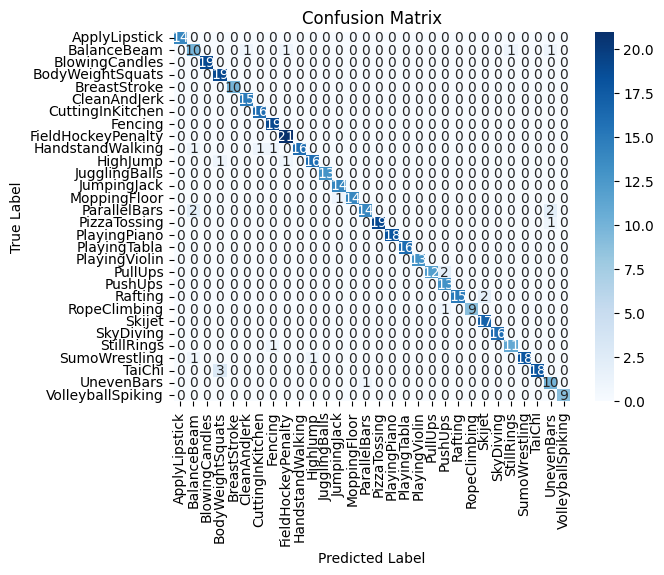

In [51]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_val, predictions_val)

# Display the confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=label_list, yticklabels=label_list)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

Sample 45: True Label = PullUps
Top-5 Predicted Labels: ['PushUps', 'PullUps', 'RopeClimbing', 'BodyWeightSquats', 'JumpingJack']
MoviePy - Building file v_PullUps_g25_c02.avi.gif with imageio.


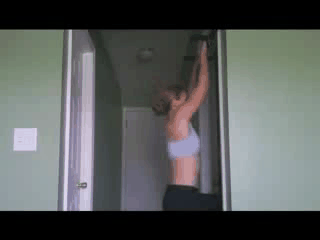

In [80]:
from sklearn.metrics import top_k_accuracy_score

# Find indices of misclassified samples
misclassified_indices = np.where(np.ravel(y_val) != predictions_val)[0]

# Display information for one misclassified sample
index = misclassified_indices[0]
true_label = y_val[index, 0]
predicted_label = predictions_val[index]

predicted_probabilities = pipeline.decision_function(X_val)

# Get the top-5 predicted labels for the misclassified sample
top5_predicted_labels = np.argsort(predicted_probabilities[index])[::-1][:5]

# Display information for the misclassified sample
true_label_str = label_list[true_label]
predicted_labels_str = [label_list[label] for label in top5_predicted_labels]

print(f"Sample {index}: True Label = {true_label_str}")
print(f"Top-5 Predicted Labels: {predicted_labels_str}")

# find the original index in train_feature_flat
label_index = np.where((train_feature_flat == X_val[index]).all(axis=1))[0][0]

# show video as GIF
sample_filename = '/'.join(['train', train_df.loc[label_index, 'video_name']])
# print(train_df.loc[label_index, 'tag'])
# print(sample_filename)
gif_filename = video_to_gif(sample_filename)
Image(open(gif_filename,'rb').read())

## FINAL MODEL TRAINING AND PREDICTION

In [12]:
# Train an SVM classifier
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=0.85)),
    ('svm', SVC(kernel='linear', max_iter=100))
])
pipeline.fit(train_feature_flat, train_label.ravel())

# Make predictions on the validation set
y_pred = pipeline.predict(test_feature_flat)

print("y_pred:", y_pred)

/opt/homebrew/lib/python3.11/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


y_pred: [ 0  0  0  0  0  0  0  0  0  0  0  0  6  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  5 13  5  1  1  1  1  1  7  1  1  1  1 10  1  1
 28  1  1  1  1 14  1  1 26  1  1  1  1  1  1 15  2  2  2  2  2  2  2  2
  2  2  2  2  2 13  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  3  3  3  3 22 22 15 25 11 11 11 11 11  3  3  3 19  3  3  3  5  3  3  3
  3 19  3  3  3  3  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  5 29 22 22  8  7  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5 15  5  5  5  5  5  5  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  7  7  7 29  7  7  7  7  1  1  7 15 15 15 15  7  7  7  7  7
  7  7  7  7  7  7  7 10  7  1  7  7  7  7  8  8  8  8  8  8  8  8  8  1
  8  8  8  1  7 10 29 10 10 10  8  8  8  8  8  8  8  8  8  8  8  8  8  8
  8  8  8  9 10  8  9  9  9 12 22 11 11 13  9 20 20  9 10  9  9  9  9  3
  3  3  9  3  8 10 19 13 13 13  9  9 22  9 

In [13]:
# IMPORTANT: use 'id' and 'predicted' as the column names
test_submission = pd.DataFrame({
    'id':list(range(len(y_pred))),
    'predicted':list(y_pred.astype('int32'))})
print(test_submission.shape)
test_submission.head()

(969, 2)


,id,predicted
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


In [14]:
# submit the CSV file to the corresponding Kaggle competition.
test_submission.to_csv('SH3_0303_ss_0.85.csv', index=False)

Kaggle result: accuracy = 0.80908